# Advanced Lane Finding Project

### The goals / steps of this project are the following:

   * Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
   * Apply a distortion correction to raw images.
   * Use color transforms, gradients, etc., to create a thresholded binary image.
   * Apply a perspective transform to rectify binary image ("birds-eye view").
   * Detect lane pixels and fit to find the lane boundary.
   * Determine the curvature of the lane and vehicle position with respect to center.
   * Warp the detected lane boundaries back onto the original image.
   * Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Camera Calibration

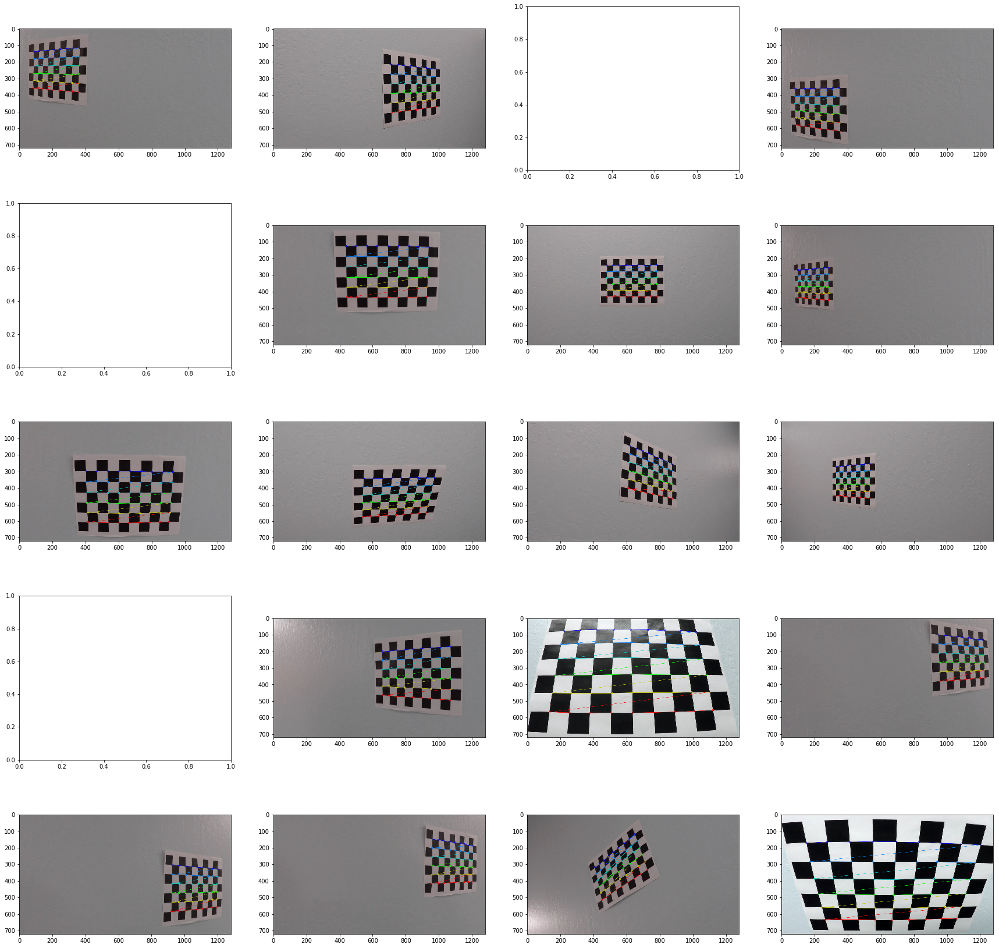

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt

%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

fig, axs = plt.subplots(5,4, figsize=(30, 30))
axs = axs.ravel()

fcimages = []
failed_images = []
#print(len(images))
# Step through the list and search for chessboard corners
for i,fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        axs[i].imshow(img)
        fcimages.append(img)
    else:
        failed_images.append(img)
        

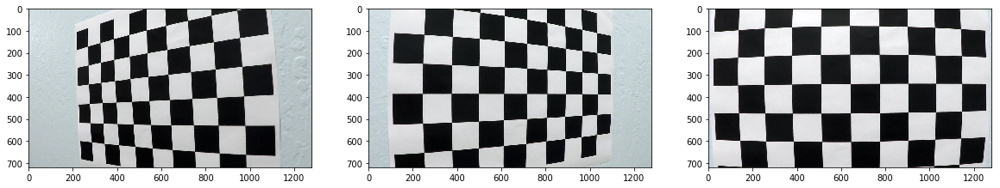

In [2]:
f, (ax1,ax2,ax3) = plt.subplots(1,3, figsize=(20,10))
ax1.imshow(failed_images[0])
ax2.imshow(failed_images[1])
ax3.imshow(failed_images[2])

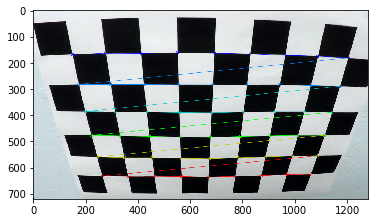

In [3]:
test_image = fcimages[16]

plt.imshow(test_image)
#print(test_image)
#print(len(test_image))

Text(0.5,1,'Undistorted Image')

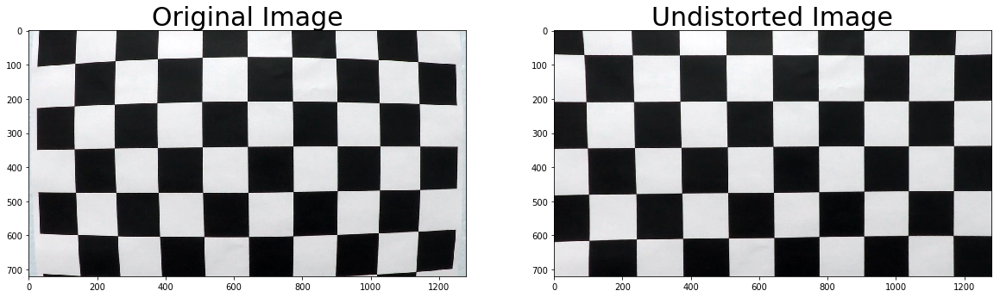

In [4]:
# Test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('output_images/test_undist.jpg',dst)


#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

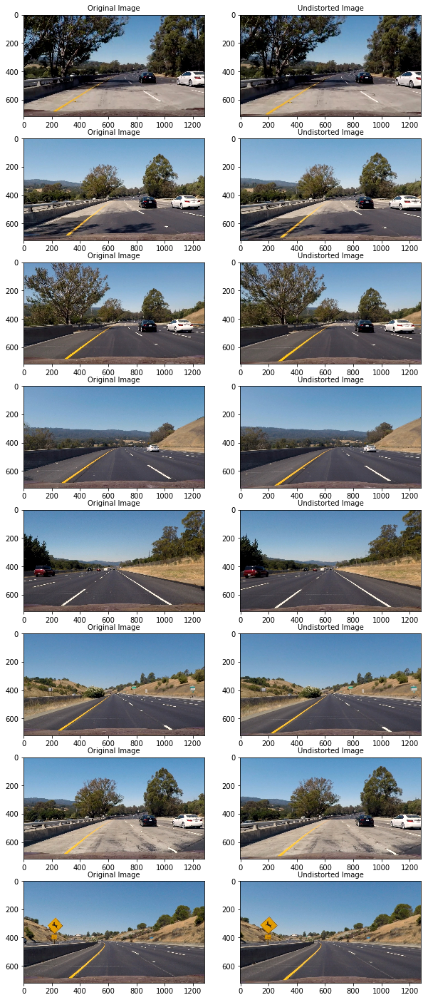

In [5]:
# Test undistortion on Test image
fnames = glob.glob('test_images/*.jpg')

images = []
undist_images = []
for fname in fnames:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    images.append(img)
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    undist_images.append(dst)                    
                        
f, axs = plt.subplots(8, 2, figsize=(10,25))
for i in range(0,8):
    axs[i,0].imshow(images[i])
    axs[i,0].set_title('Original Image', fontsize=10)
    axs[i,1].imshow(undist_images[i])
    axs[i,1].set_title('Undistorted Image', fontsize=10)

## Color Transformas, Gradient Thresholded 

### Gradient Threshold

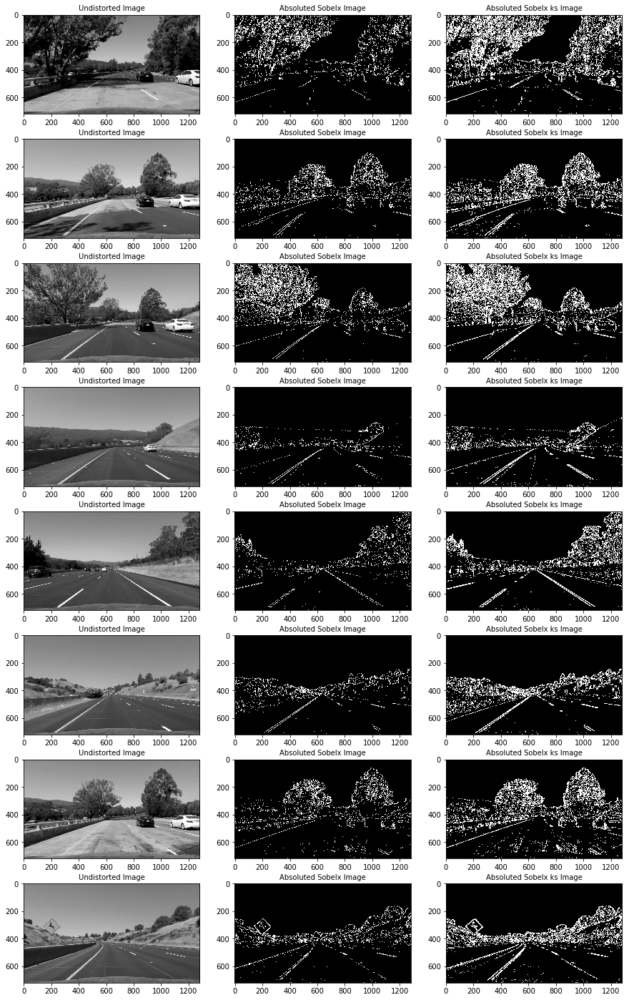

In [6]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    
    gray =  cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F,1,0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F,0,1, ksize = sobel_kernel)
    
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobelx))
    
    sxbinaryx = np.zeros_like(scaled_sobelx)
    sxbinaryy = np.zeros_like(scaled_sobely)
    
    sxbinaryx[(scaled_sobelx >= thresh[0]) & (scaled_sobelx <= thresh[1])] = 1
    sxbinaryy[(scaled_sobely >= thresh[0]) & (scaled_sobely <= thresh[1])] = 1
    
    if orient == 'x':
        binary_output = np.copy(sxbinaryx)
    else:
        binary_output = np.copy(sxbinaryy)
        
    return binary_output


abs_grad_x_images = []
for undist_image in undist_images:
    abs_grad_x_images.append(abs_sobel_thresh(undist_image, orient='x',sobel_kernel=3, thresh = (20, 100)))
    
abs_grad_x_ks_images = []
for undist_image in undist_images:
    abs_grad_x_ks_images.append(abs_sobel_thresh(undist_image, orient='x',sobel_kernel=9, thresh = (15, 150)))

gray_images = []
for undist_image in undist_images: 
    gray_images.append(cv2.cvtColor(undist_image, cv2.COLOR_RGB2GRAY))
    
                        
f, axs = plt.subplots(8, 3, figsize=(15,25))
for i in range(0,8):
    axs[i,0].imshow(gray_images[i], cmap = 'gray')
    axs[i,0].set_title('Undistorted Image', fontsize=10)
    axs[i,1].imshow(abs_grad_x_images[i], cmap = 'gray')
    axs[i,1].set_title('Absoluted Sobelx Image', fontsize=10)
    axs[i,2].imshow(abs_grad_x_ks_images[i], cmap = 'gray')
    axs[i,2].set_title('Absoluted Sobelx ks Image', fontsize=10)

(array([  1,   1,   1, ..., 718, 718, 718]), array([  5,   6,   7, ..., 959, 960, 961]))
1
(array([ 98,  98,  98, ..., 718, 718, 718]), array([ 967,  968,  969, ..., 1216, 1217, 1218]))
0
(array([  1,   1,   1, ..., 718, 718, 718]), array([  10,   11,   12, ..., 1203, 1204, 1205]))
0
(array([218, 218, 219, ..., 718, 718, 718]), array([1278, 1279, 1276, ..., 1220, 1221, 1222]))
0
(array([  1,   1,   1, ..., 718, 718, 718]), array([1208, 1209, 1210, ..., 1172, 1173, 1174]))
0
(array([241, 241, 242, ..., 718, 718, 718]), array([1276, 1277, 1182, ..., 1220, 1221, 1255]))
0
(array([ 62,  62,  62, ..., 718, 718, 718]), array([ 994,  995, 1002, ..., 1114, 1115, 1116]))
0
(array([158, 158, 158, ..., 718, 718, 718]), array([1140, 1141, 1143, ..., 1219, 1220, 1221]))
0


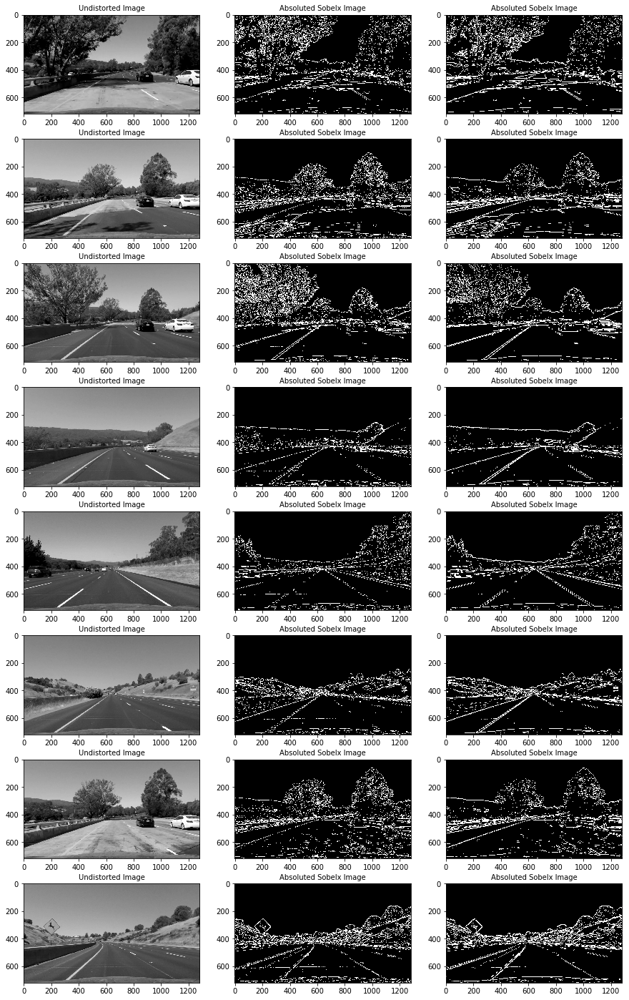

In [7]:
abs_grad_y_images = []
for undist_image in undist_images:
    abs_grad_y_images.append(abs_sobel_thresh(undist_image, orient='y', thresh = (20, 100)))

    
abs_grad_y_ks_images = []
for undist_image in undist_images:
    abs_grad_y_ks_images.append(abs_sobel_thresh(undist_image, orient='y',sobel_kernel=9, thresh = (30, 150)))
                        
f, axs = plt.subplots(8, 3, figsize=(15,25))
for i in range(0,8):
    print(abs_grad_y_images[i].nonzero())
    print(abs_grad_y_images[i][1][7])
    axs[i,0].imshow(gray_images[i], cmap = 'gray')
    axs[i,0].set_title('Undistorted Image', fontsize=10)
    axs[i,1].imshow(abs_grad_y_images[i], cmap = 'gray')
    axs[i,1].set_title('Absoluted Sobelx Image', fontsize=10)
    axs[i,2].imshow(abs_grad_y_ks_images[i], cmap = 'gray')
    axs[i,2].set_title('Absoluted Sobelx Image', fontsize=10)

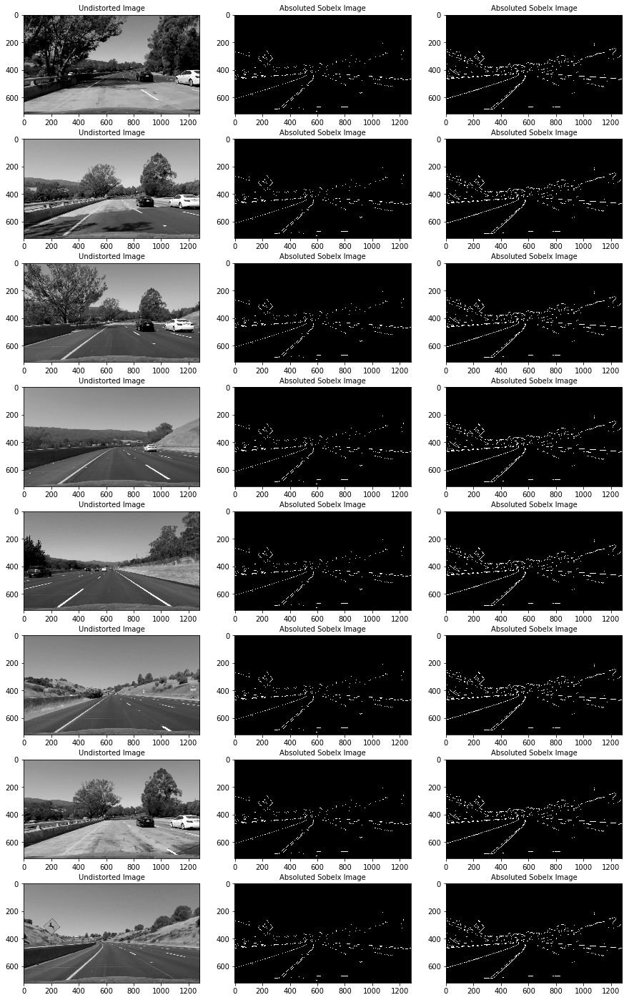

In [8]:
def mag_thresh(image, sobel_kernel=3, mag_thresh=(0,255)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F,1,0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F,0,1, ksize=sobel_kernel)
    
    mag = np.sqrt(sobelx**2 + sobely**2)
    mag_sobel = np.uint8(255 * mag / np.max(mag))
    
    mag_binary = np.zeros_like(mag_sobel)
    mag_binary[(mag_sobel >= mag_thresh[0]) & (mag_sobel <= mag_thresh[1])] = 1
    
    
    return mag_binary

mag_images = []
for undist_image in undist_images:
    mag_images.append(mag_thresh(undist_image, sobel_kernel=3, mag_thresh = (80, 150)))
    
mag_ks_images = []
for undist_image in undist_images:
    mag_ks_images.append(mag_thresh(undist_image, sobel_kernel=9, mag_thresh = (80, 150)))
    
                        
f, axs = plt.subplots(8, 3, figsize=(15,25))
for i in range(0,8):
    axs[i,0].imshow(gray_images[i], cmap = 'gray')
    axs[i,0].set_title('Undistorted Image', fontsize=10)
    axs[i,1].imshow(mag_images[i], cmap = 'gray')
    axs[i,1].set_title('Absoluted Sobelx Image', fontsize=10)
    axs[i,2].imshow(mag_ks_images[i], cmap = 'gray')
    axs[i,2].set_title('Absoluted Sobelx Image', fontsize=10)

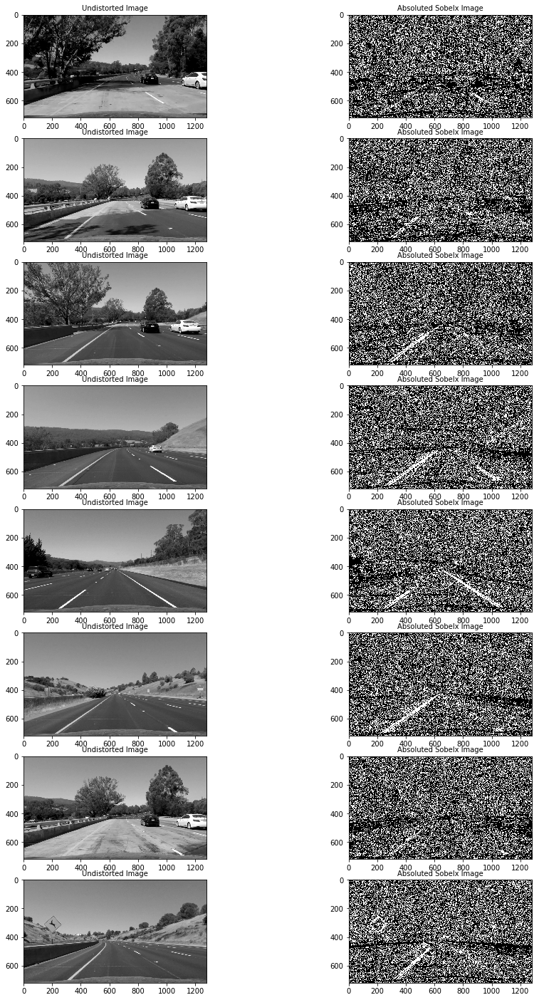

In [9]:
def dir_threshold(img, sobel_kernel=3,dir_thresh=(0,np.pi/2)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F,1,0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F,0,1, ksize=sobel_kernel)
    
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    dir_grad = np.arctan2(abs_sobely, abs_sobelx)
    
    dir_binary = np.zeros_like(dir_grad)
    dir_binary[(dir_grad >= dir_thresh[0]) & (dir_grad <= dir_thresh[1])] = 1
    
    return dir_binary

dir_images = []
for undist_image in undist_images:
    dir_images.append(dir_threshold(undist_image, sobel_kernel=9, dir_thresh = (0.6, 1.2)))
    
                        
f, axs = plt.subplots(8, 2, figsize=(15,25))
for i in range(0,8):
    axs[i,0].imshow(gray_images[i], cmap = 'gray')
    axs[i,0].set_title('Undistorted Image', fontsize=10)
    axs[i,1].imshow(dir_images[i], cmap = 'gray')
    axs[i,1].set_title('Absoluted Sobelx Image', fontsize=10)

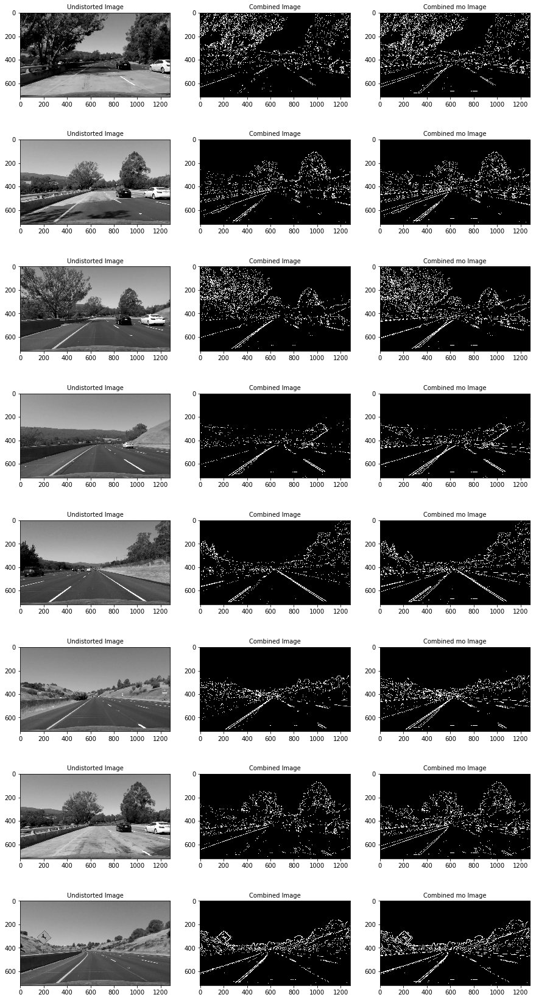

In [10]:
# Gradient Combining Thresholds
ksize = 7
combined_images = []
combined_images_mo = []
for undist_image in undist_images:
    gradx = abs_sobel_thresh(undist_image,orient='x',sobel_kernel=ksize, thresh=(20,255))
    grady = abs_sobel_thresh(undist_image,orient='y',sobel_kernel=ksize, thresh=(20,255))
    mag_binary = mag_thresh(undist_image, sobel_kernel=ksize, mag_thresh = (80, 150))
    dir_binary = dir_threshold(undist_image, sobel_kernel=ksize, dir_thresh = (0.3, 1.0))
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx ==1)&(grady == 1))|((mag_binary ==1)&(dir_binary==1))]=1
    combined_images.append(combined_binary)
    combined_binary_mo = np.zeros_like(dir_binary)
    combined_binary_mo[((gradx ==1)&(grady == 1))|((mag_binary ==1))]=1
    combined_images_mo.append(combined_binary_mo)
    
f, axs = plt.subplots(8, 3, figsize=(15,30))
for i in range(0,8):
    axs[i,0].imshow(gray_images[i], cmap = 'gray')
    axs[i,0].set_title('Undistorted Image', fontsize=10)
    axs[i,1].imshow(combined_images[i], cmap = 'gray')
    axs[i,1].set_title('Combined Image', fontsize=10)
    axs[i,2].imshow(combined_images_mo[i], cmap = 'gray')
    axs[i,2].set_title('Combined mo Image', fontsize=10)

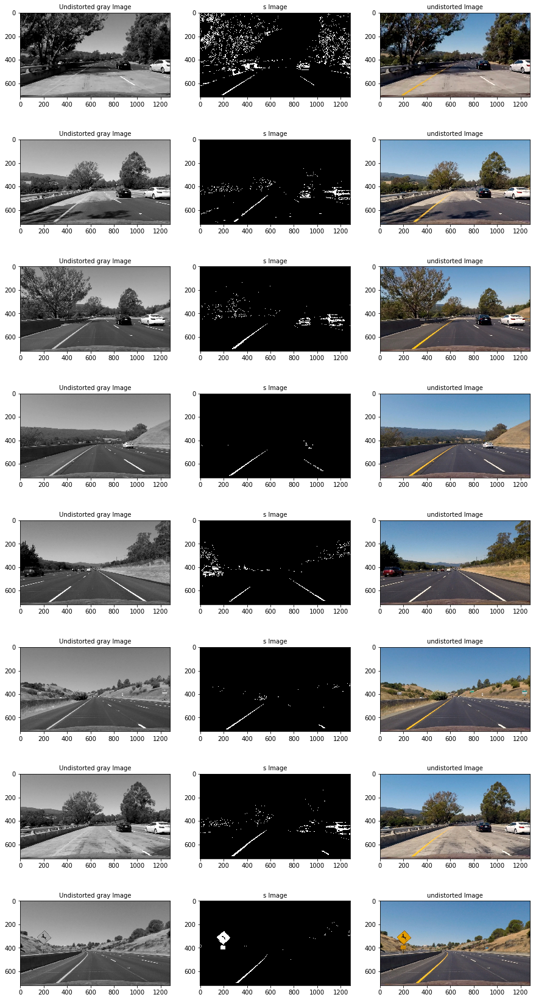

In [11]:
## Color Transforms and Thresholds
import matplotlib.image as mpimg

def hls_select(img, thresh=(0,255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    binary_output = np.zeros_like(S)
    binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1
    return binary_output

s_images = []
for undist_image in undist_images:
    s_image = hls_select(undist_image, thresh=(180,255))
    s_images.append(s_image)
    
f, axs = plt.subplots(8, 3, figsize=(15,30))
for i in range(0,8):
    axs[i,0].imshow(gray_images[i], cmap = 'gray')
    axs[i,0].set_title('Undistorted gray Image', fontsize=10)
    axs[i,1].imshow(s_images[i], cmap = 'gray')
    axs[i,1].set_title('s Image', fontsize=10)
    axs[i,2].imshow(undist_images[i])
    axs[i,2].set_title('undistorted Image', fontsize=10)

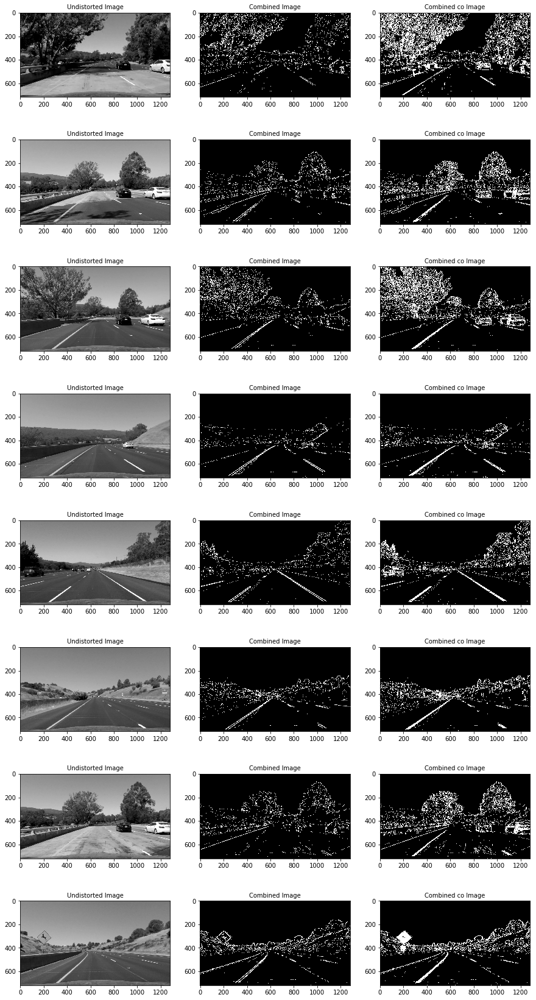

In [12]:
## Color and Gradient Combine
ksize = 7
combined_images = []
combined_images_co = []
for undist_image in undist_images:
    gradx = abs_sobel_thresh(undist_image,orient='x',sobel_kernel=ksize, thresh=(20,255))
    grady = abs_sobel_thresh(undist_image,orient='y',sobel_kernel=ksize, thresh=(20,255))
    mag_binary = mag_thresh(undist_image, sobel_kernel=ksize, mag_thresh = (80, 150))
    dir_binary = dir_threshold(undist_image, sobel_kernel=ksize, dir_thresh = (0.3, 1.0))
    color_binary = hls_select(undist_image, thresh=(180,255))
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx ==1)&(grady == 1))|((mag_binary ==1)&(dir_binary==1))]=1
    combined_images.append(combined_binary)
    combined_binary_co = np.zeros_like(dir_binary)
    combined_binary_co[((gradx==1))|((mag_binary==1)&(dir_binary==1))|(color_binary==1)]=1
    combined_images_co.append(combined_binary_co)
    
f, axs = plt.subplots(8, 3, figsize=(15,30))
for i in range(0,8):
    axs[i,0].imshow(gray_images[i], cmap = 'gray')
    axs[i,0].set_title('Undistorted Image', fontsize=10)
    axs[i,1].imshow(combined_images[i], cmap = 'gray')
    axs[i,1].set_title('Combined Image', fontsize=10)
    axs[i,2].imshow(combined_images_co[i], cmap = 'gray')
    axs[i,2].set_title('Combined co Image', fontsize=10)

In [13]:
def color_gradient_combined(undist_image):  
    gradx = abs_sobel_thresh(undist_image,orient='x',sobel_kernel=ksize, thresh=(20,255))
    grady = abs_sobel_thresh(undist_image,orient='y',sobel_kernel=ksize, thresh=(20,255))
    mag_binary = mag_thresh(undist_image, sobel_kernel=ksize, mag_thresh = (80, 150))
    dir_binary = dir_threshold(undist_image, sobel_kernel=ksize, dir_thresh = (0.3, 1.0))
    color_binary = hls_select(undist_image, thresh=(180,255))
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx ==1)&(grady == 1))|((mag_binary ==1)&(dir_binary==1))]=1
    combined_binary_co = np.zeros_like(dir_binary)
    combined_binary_co[((gradx==1))|((mag_binary==1)&(dir_binary==1))|(color_binary==1)]=1
    
    return combined_binary_co
    
    

### Region of Interest

(array([  1,   1,  99, ..., 719, 719, 719]), array([   2, 1276,  965, ...,  596,  837,  838]))
1.0
(array([420, 420, 420, ..., 719, 719, 719]), array([580, 581, 582, ..., 596, 837, 838]))
1.0


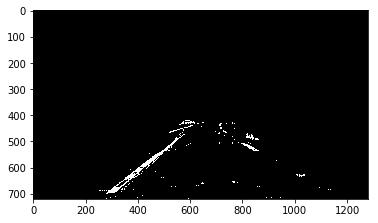

In [14]:
def region_of_interest(img, vertices):
    
    mask = np.zeros_like(img)
    
    if len(img.shape) > 2:
        channel_count = img.shpae[2]
        ignore_mask_color =(1,) * channel_count
    else:
        ignore_mask_color = 1

    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    masked_image = cv2.bitwise_and(img, mask)
    
    return masked_image

test_img = combined_images_co[1]

imshape = test_img.shape
vertices = np.array([[(imshape[1]*0.15,imshape[0]),(580, 420),(750, 420),(imshape[1]*0.95,imshape[0])]],dtype=np.int32)

roi_img = region_of_interest(test_img, vertices)
plt.imshow(roi_img, cmap='gray')
print(test_img.nonzero())
print(test_img[420][580])
print(roi_img.nonzero())
print(roi_img[420][580])

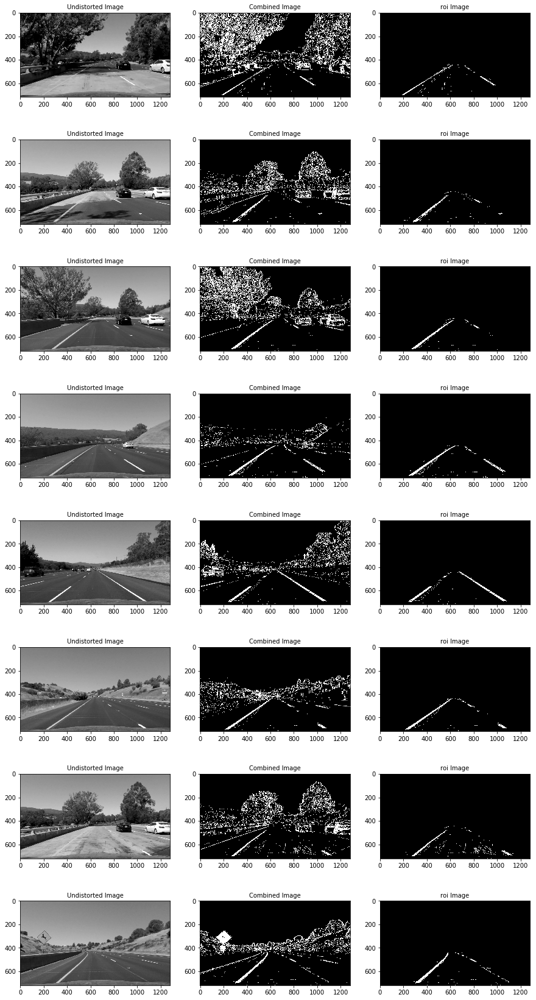

In [15]:
roi_images = []
imshape = combined_images_co[0].shape
vertices = np.array([[(imshape[1]*0.1,imshape[0]),(580, 440),(700, 440),(imshape[1]*0.95,imshape[0])]],dtype=np.int32)
for image in combined_images_co:
    roi_image = region_of_interest(image, vertices)
    roi_images.append(roi_image)
    

f, axs = plt.subplots(8, 3, figsize=(15,30))
for i in range(0,8):
    axs[i,0].imshow(gray_images[i], cmap = 'gray')
    axs[i,0].set_title('Undistorted Image', fontsize=10)
    axs[i,1].imshow(combined_images_co[i], cmap = 'gray')
    axs[i,1].set_title('Combined Image', fontsize=10)
    axs[i,2].imshow(roi_images[i], cmap = 'gray')
    axs[i,2].set_title('roi Image', fontsize=10)    

## Perspective Transform

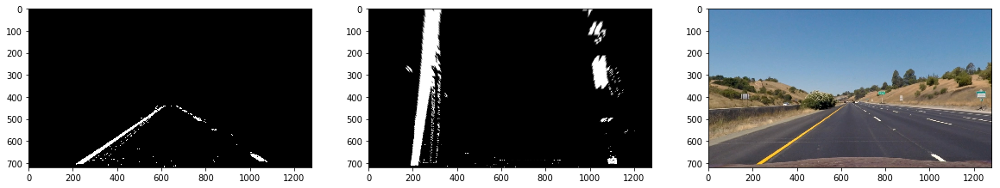

In [16]:
index = 5
test_img = roi_images[index]
width = test_img.shape[1]
height = test_img.shape[0]
src = np.float32([[width*0.4, height*0.65],[width*0.6,height*0.65],
                  [width, height],[0,height]])

dst = np.float32([[0,0],[width,0],
                  [width,height],[0,height]])

M = cv2.getPerspectiveTransform(src,dst)

warped = cv2.warpPerspective(test_img, M, (width, height))
f, axs = plt.subplots(1, 3, figsize=(20,20))
axs[0].imshow(test_img,cmap='gray')
axs[1].imshow(warped,cmap='gray')
axs[2].imshow(undist_images[index])


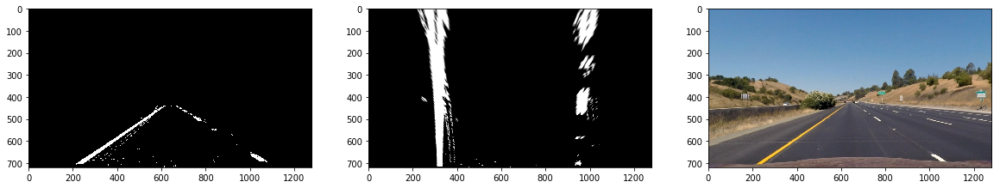

In [17]:
index = 5
test_img = roi_images[index]
width = test_img.shape[1]
height = test_img.shape[0]
img_size = (width, height)

src = np.float32(
    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

M = cv2.getPerspectiveTransform(src,dst)

warped = cv2.warpPerspective(test_img, M, (width, height))
f, axs = plt.subplots(1, 3, figsize=(20,20))
axs[0].imshow(test_img,cmap='gray')
axs[1].imshow(warped,cmap='gray')
axs[2].imshow(undist_images[index])

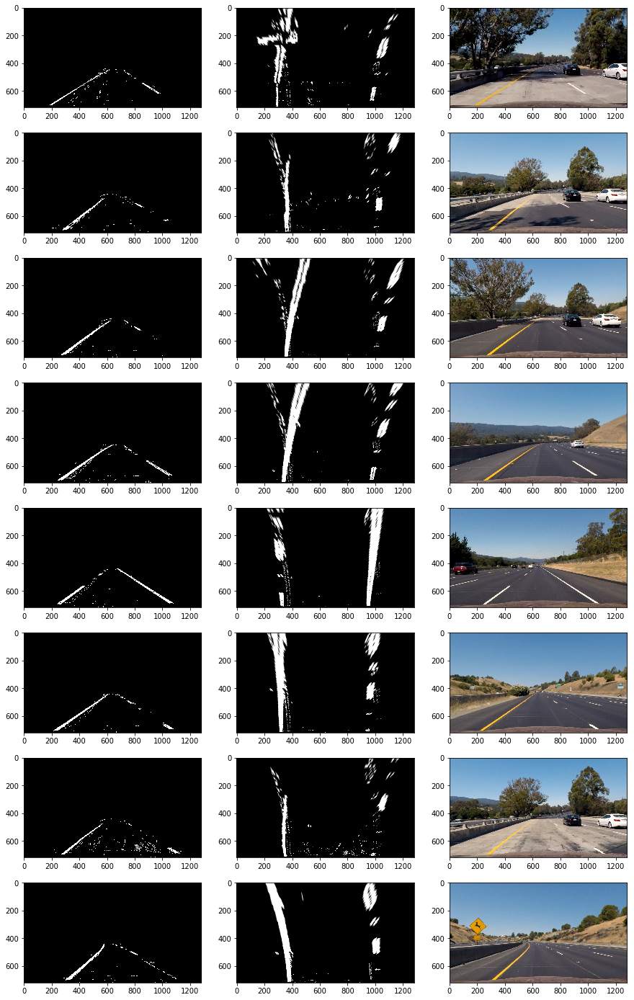

In [66]:
def Perspective_Transform(img):
    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32(
    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])
    M = cv2.getPerspectiveTransform(src,dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size)
    
    return warped, Minv

PT_images = []



for roi_image in roi_images:
    PT_image, Minv= Perspective_Transform(roi_image)
    PT_images.append(PT_image)

f, axs = plt.subplots(8, 3, figsize=(15,25))
for i in range(0,8):
    axs[i,0].imshow(roi_images[i],cmap='gray')
    axs[i,1].imshow(PT_images[i],cmap='gray')
    axs[i,2].imshow(undist_images[i])

## Find Lane Lines

In [19]:
class Line():
    def __init__(self):

        self.detected = False  
        
        self.recent_xfitted = [] 
        self.bestx = None     

        self.best_fit = None  
        self.current_fit = [np.array([False])]  
        
        self.radius_of_curvature = None 
        self.line_base_pos = None 

        self.diffs = np.array([0,0,0], dtype='float') 

        self.allx = None  
        self.ally = None
        
#def sanity_check():

[ 3.17356085e-04 -4.27366428e-01  5.10338189e+02]
[ 6.89266463e-04 -7.03379227e-01  1.21056860e+03]


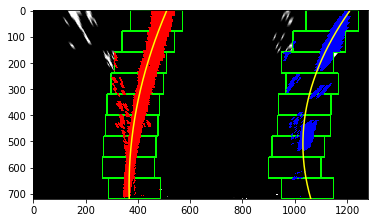

In [20]:
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2

%matplotlib inline

binary_warped = PT_images[2]


def find_lane_pixels(binary_warped):
    
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:],axis = 0)
    out_img = np.uint8(np.dstack((binary_warped, binary_warped, binary_warped))*255)
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    nwindows = 9 
    margin = 100 
    minpix = 50 
    
    window_height = np.int(binary_warped.shape[0]//nwindows)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    left_lane_inds = []
    right_lane_inds = []
    
    
    for window in range(nwindows):
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        
        cv2.rectangle(out_img,(win_xleft_low, win_y_low),(win_xleft_high,win_y_high),(0,255,0),3)
        cv2.rectangle(out_img,(win_xright_low, win_y_low),(win_xright_high,win_y_high),(0,255,0),3)
        
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &(nonzerox >= win_xleft_low)
                         & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &(nonzerox >= win_xright_low)
                         & (nonzerox < win_xright_high)).nonzero()[0]
        
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        pass
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    
    left_fitx, right_fitx, ploty, left_fit, right_fit = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    
    return leftx, lefty, rightx, righty, left_fitx, right_fitx, left_fit, right_fit, ploty, out_img


def fit_poly(img_shape, leftx, lefty, rightx, righty):
    
    left_fit = np.polyfit(lefty,leftx,2)
    right_fit = np.polyfit(righty,rightx,2)
    
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty, left_fit, right_fit
    
leftx, lefty, rightx, righty, left_fitx, right_fitx, left_fit, right_fit, ploty, out_img = find_lane_pixels(binary_warped)
out_img[lefty, leftx] = [255, 0, 0]
out_img[righty, rightx] = [0, 0, 255]

plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')    
print(left_fit)
print(right_fit)

plt.imshow(out_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


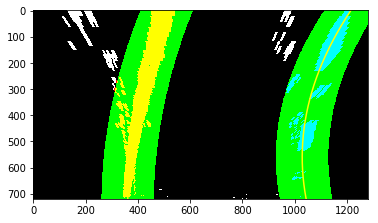

In [21]:
binary_warped = PT_images[2]


def search_around_poly(binary_warped, left_fit, right_fit):
    
    margin = 100
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy 
                     + left_fit[2] - margin)) 
                     & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy 
                     + left_fit[2] + margin)))
    
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy 
                     + right_fit[2] - margin)) 
                     & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy 
                     + right_fit[2] + margin)))
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    
    left_fitx, right_fitx, ploty, left_fit_current, right_fit_current = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    return left_fitx, right_fitx, ploty, left_fit_current, right_fit_current

def search_around_poly_visualization(binary_warped, left_fit, right_fit):
    
    margin = 100
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy 
                     + left_fit[2] - margin)) 
                     & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy 
                     + left_fit[2] + margin)))
    
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy 
                     + right_fit[2] - margin)) 
                     & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy 
                     + right_fit[2] + margin)))
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    
    left_fitx, right_fitx, ploty, left_fit_current, right_fit_current = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result

#left_fitx, right_fitx, ploty, left_fit_current, right_fit_current = search_around_poly(binary_warped, left_fit, right_fit)

result = search_around_poly_visualization(binary_warped, left_fit, right_fit)

# View your output
plt.imshow(result)    


In [22]:
def search_around_poly(binary_warped, left_fit, right_fit):
    
    margin = 100
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy 
                     + left_fit[2] - margin)) 
                     & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy 
                     + left_fit[2] + margin)))
    
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy 
                     + right_fit[2] - margin)) 
                     & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy 
                     + right_fit[2] + margin)))
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    
    left_fitx, right_fitx, ploty, left_fit_current, right_fit_current = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    return left_fitx, right_fitx, ploty, left_fit_current, right_fit_current

## Measure Curvature of Lanes

In [23]:
def measure_curvature_pixels(ploty, left_fit, right_fit):
    
    y_eval = np.max(ploty)
    
    left_curverad = ((1 + (2 * left_fit[0] * y_eval + left_fit[1])**2)**1.5) / (np.absolute(2 * left_fit[0]))
    right_curverad = ((1 + (2 * right_fit[0] * y_eval + right_fit[1])**2)**1.5) / (np.absolute(2 * right_fit[0]))
    
        
    return left_curverad, right_curverad

left_curverad, right_curverad = measure_curvature_pixels(ploty, left_fit, right_fit)

print(left_curverad, right_curverad)

1577.5040795012783 817.3681514760083


In [24]:
def measure_curvature_meter(ploty, left_fit, right_fit):
    
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700
    
    y_eval = np.max(ploty)
    
    
    left_curverad = ((1 + (2 * left_fit[0] * y_eval * ym_per_pix + left_fit[1])**2)**1.5) / (np.absolute(2 * left_fit[0]))
    right_curverad = ((1 + (2 * right_fit[0] * y_eval * ym_per_pix + right_fit[1])**2)**1.5) / (np.absolute(2 * right_fit[0]))
    
    center_offset = (((left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]) + (right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]))/2 - 640) * xm_per_pix
    
        
    return left_curverad, right_curverad, center_offset

left_curverad, right_curverad, center_offset = measure_curvature_meter(ploty, left_fit, right_fit)

print(left_curverad, right_curverad, center_offset)

1985.5938673042801 1251.3537398698684 0.39273661597262904


## Drawing measurement of lines

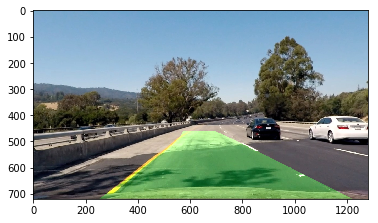

In [77]:
test_undist_image  = undist_images[1]

combined_image = color_gradient_combined(test_undist_image)

imshape = combined_image.shape
vertices = np.array([[(imshape[1]*0.15,imshape[0]),(580, 420),(750, 420),(imshape[1]*0.95,imshape[0])]],dtype=np.int32)
roi_image = region_of_interest(combined_image, vertices)
PT_image, Minv= Perspective_Transform(roi_image)
leftx, lefty, rightx, righty, left_fitx, right_fitx, left_fit, right_fit, ploty, out_img = find_lane_pixels(PT_image)
left_fitx_cur, right_fitx_cur, ploty, left_fit_current, right_fit_current = search_around_poly(PT_image, left_fit, right_fit)


warp_zero = np.zeros_like(PT_image).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx_cur, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx_cur, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (test_undist_image.shape[1], test_undist_image.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(test_undist_image, 1, newwarp, 0.3, 0)
plt.imshow(result)

